<a href="https://colab.research.google.com/github/manikantmnnit/ComputerVision/blob/main/Edge_detection_using_kernel_matrices__cv2_and_pytorch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
import torchvision.datasets as datasets


Gray = 0.299R + 0.587G + 0.114*B

In [ ]:
row1=np.zeros((1,6))
row2=np.zeros((1,6))
row3=np.ones((1,6))
row4=np.ones((1,6))
row5=np.ones((1,6))
row6=np.zeros((1,6))
img=np.vstack((row1,row2,row3,row4,row5,row6))

In [ ]:
!pip install opencv-python


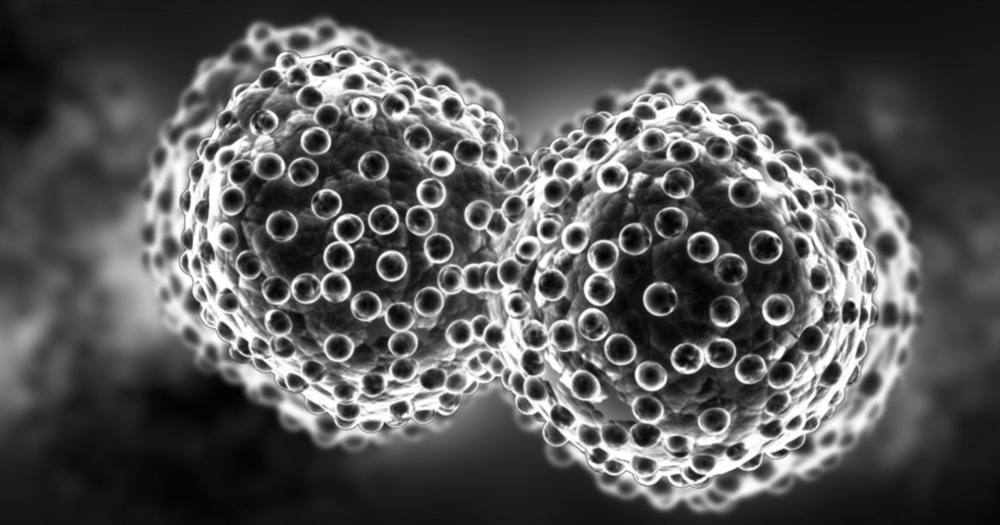

In [ ]:
from google.colab.patches import cv2_imshow
img=cv2.imread('/content/cancer_cell.jpg',cv2.IMREAD_GRAYSCALE)
cv2_imshow(img)
cv2.waitKey(0)
cv2.destroyAllWindows()

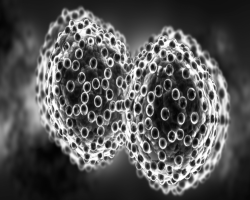

In [ ]:
# resize image
img_resize=cv2.resize(img,(0,0),fx=0.5,fy=0.4)   # If dsize is set to (0, 0) or None, then the scaling factors fx and fy would be applied,
img_resize=cv2.resize(img,(150,200))   #  If you specify dsize, the function will ignore the fx and fy scaling factors because the size is already defined.
img_resize=cv2.resize(img,(150,200),fx=0.1,fy=0.1)  #  provided both dsize and scaling factors, but the function will prioritize dsize = (150, 200) and ignore fx=0.1 and fy=0.1.
# img_resize=cv2.resize(img,fx=0.5,fy=0.4)   # not working
# img_resize=cv2.resize(img,(150,200),interpolation=cv2.INTER_CUBIC)
img_resize=cv2.resize(img,(250,200),interpolation=cv2.INTER_AREA)
cv2_imshow(img_resize)


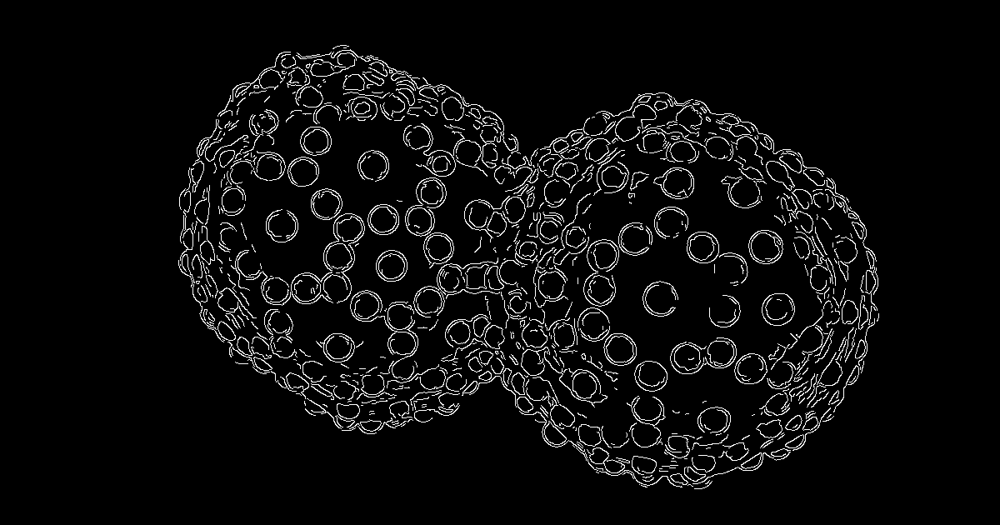

In [ ]:
# Apply Canny edge detection
edges = cv2.Canny(img, 200, 250)    # first   and second threshold value for the hysteresis procedure.
edges = cv2.Canny(img, 200, 250, L2gradient=True)
cv2_imshow(edges)
cv2.waitKey(0)
cv2.destroyAllWindows()

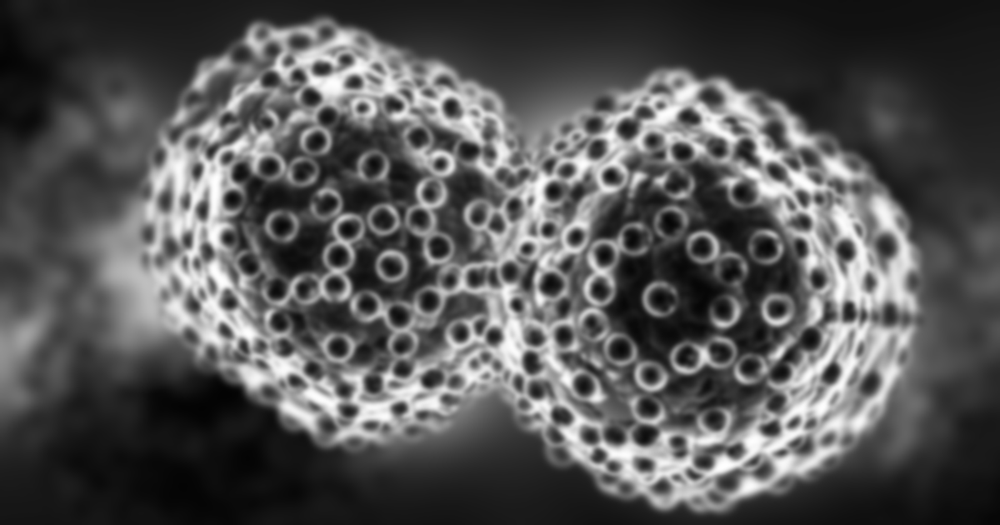

In [ ]:
# Gaussian Blur
img_blurred=cv2.GaussianBlur(img,(15,15),0)   # (15, 15) (Kernel Size):   0 (SigmaX - Standard Deviation in X Direction):
cv2_imshow(img_blurred)
cv2.waitKey(0)
cv2.destroyAllWindows()

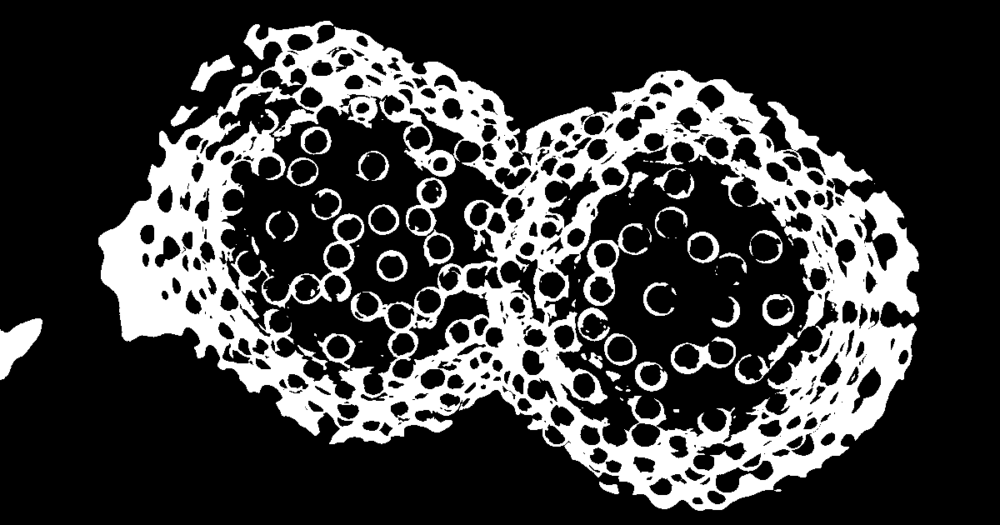

In [ ]:
# Apply binary thresholding
_, thresholded_image = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)   # 127 (Threshold Value):  255 (Max Value):  cv2.THRESH_BINARY (Thresholding Type):

# Display the thresholded image
cv2_imshow( thresholded_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

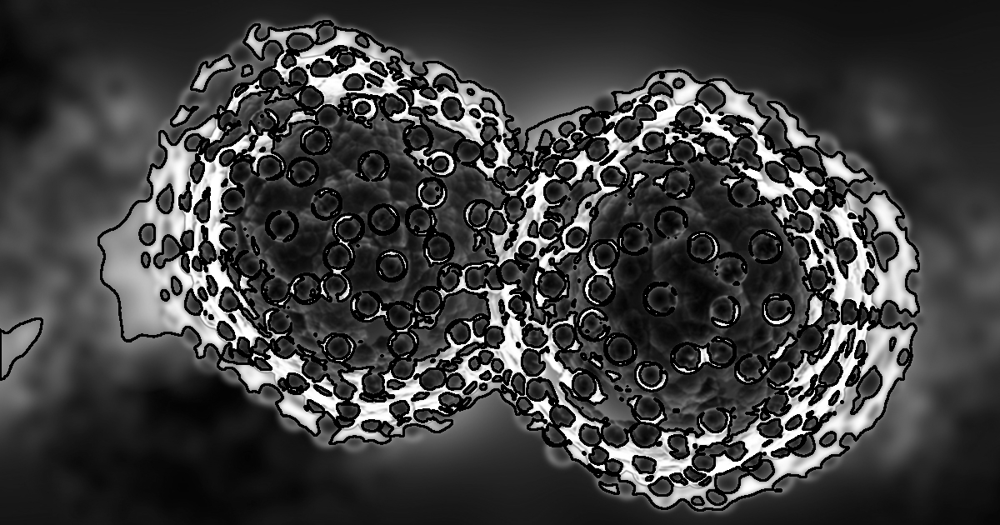

In [ ]:
#  Find contours
contours, _ = cv2.findContours(thresholded_image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

# Draw the contours on the original image
cv2.drawContours(img, contours, -1, (0, 255, 0), 2)

# Display the image with contours
cv2_imshow(img)
cv2.waitKey(0)
cv2.destroyAllWindows()

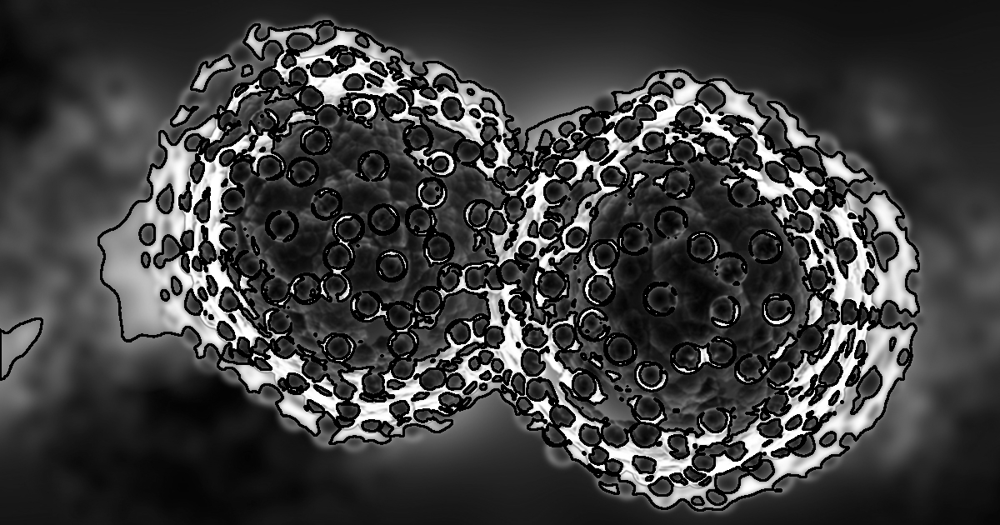

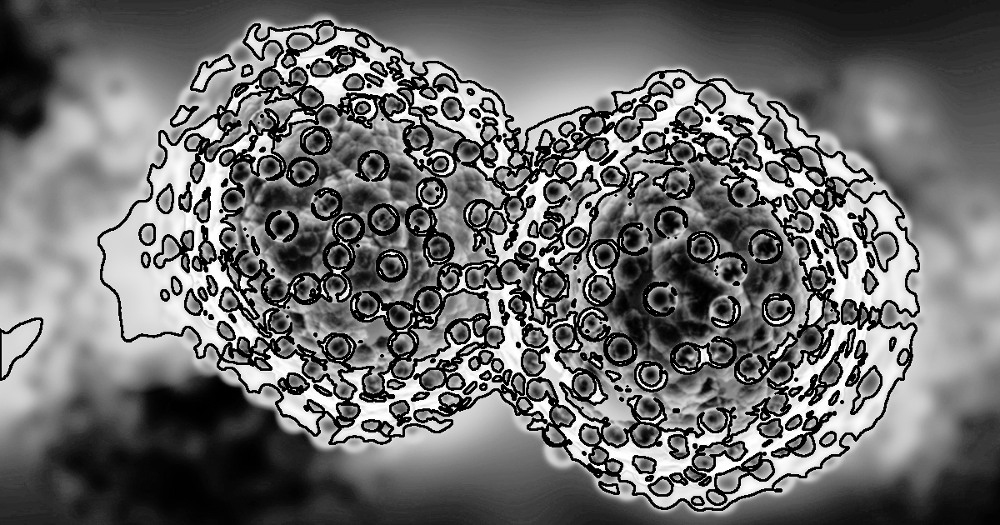

In [ ]:
# Apply histogram equalization
equalized_image = cv2.equalizeHist(img)

# Display the original and equalized images
cv2_imshow( img)
cv2_imshow( equalized_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
print(img.shape)
rows,cols=img.shape

(630, 1200)


In [ ]:
kernel_size=3
kernel=[
    [1,0,-1],
    [2,0,-2],
    [1,0,-1]
]
output=np.zeros((rows-kernel_size+1,cols-kernel_size+1))

In [ ]:
print('output size',output.shape)
print('input size',img.shape)

output size (628, 1198)
input size (630, 1200)


In [ ]:
# apply concolution
for i in range(1,rows-1):
  for j in range(1,cols-1):
      region=img[i-1:i+2,j-1:j+2]
      output[i-1,j-1]=np.sum(region*kernel)



In [ ]:
print(f'min value and output values in output:{np.min(output)} and {np.max(output)}')
# gray scale range is 0 and 255 so that we have to keap range between 0 and 255
output[output<0]=0
output[output>255]=255
output=output.astype(np.uint8)
print(f'min value and output values in output after range dimishing :{np.min(output)} and {np.max(output)}')



min value and output values in output:-1020.0 and 1020.0
min value and output values in output after range dimishing :0 and 255


In [ ]:
# convert image vlaues into tensors
# img=cv2.imread('/content/cancer_cell.jpg')
img_tensor=torch.tensor(output,dtype=torch.float32)
kernel_tensor=torch.tensor(kernel,dtype=torch.float32)
print(img_tensor.size())
print(kernel_tensor.shape)

torch.Size([628, 1198])
torch.Size([3, 3])


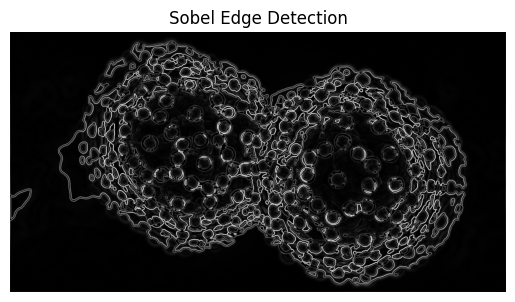

In [ ]:

image_tensor = torch.tensor(img, dtype=torch.float32).unsqueeze(0).unsqueeze(0)  # [1, 1, H, W]

# Define Sobel kernels
sobel_kernel_x = torch.tensor([[-1., 0., 1.],
                               [-2., 0., 2.],
                               [-1., 0., 1.]]).unsqueeze(0).unsqueeze(0)

sobel_kernel_y = torch.tensor([[-1., -2., -1.],
                               [0., 0., 0.],
                               [1., 2., 1.]]).unsqueeze(0).unsqueeze(0)

# Apply convolution
edge_x = F.conv2d(image_tensor, sobel_kernel_x, padding=1)
edge_y = F.conv2d(image_tensor, sobel_kernel_y, padding=1)

# Combine edges
edge_magnitude = torch.sqrt(edge_x**2 + edge_y**2).squeeze().detach().numpy()

# Display result
plt.imshow(edge_magnitude, cmap='gray')
plt.title('Sobel Edge Detection')
plt.axis('off')
plt.show()

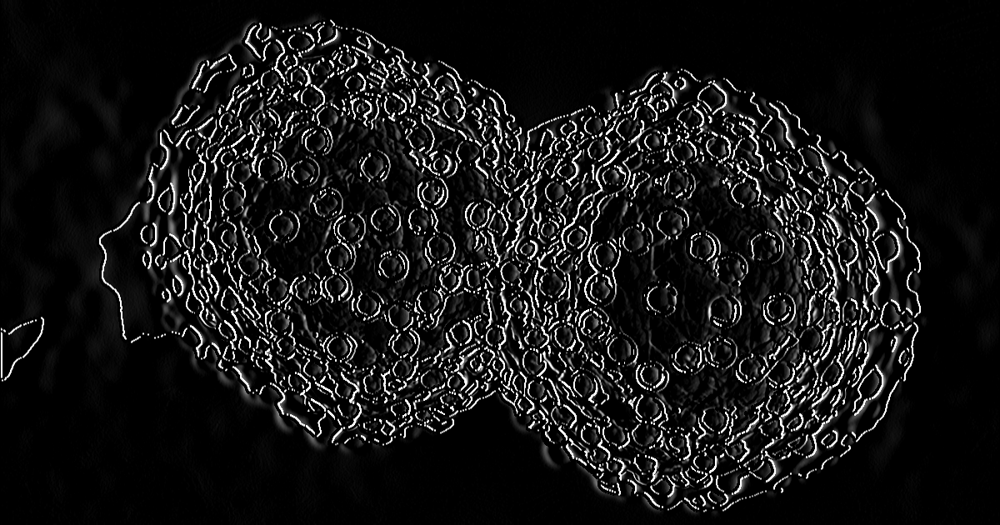

In [ ]:
# Edge Detection (Sobel Operator)
sobel_x_kernel = np.array([
                   [-1, 0, 1],
                   [-2, 0, 2],
                   [-1, 0, 1]
                    ])
edge_img=cv2.filter2D(src=img, ddepth=-1, kernel=sobel_x_kernel)
cv2_imshow(edge_img)

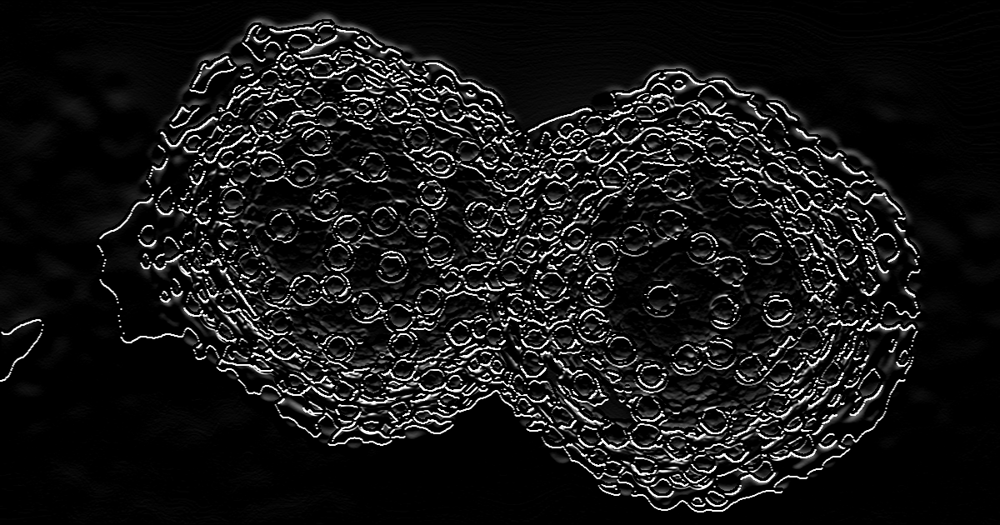

In [ ]:
sobel_y_kernel = np.array([[-1, -2, -1],
                           [ 0,  0,  0],
                           [ 1,  2,  1]])
edge_img=cv2.filter2D(src=img, ddepth=-1, kernel=sobel_y_kernel)
cv2_imshow(edge_img)



*  torch.nn.functional.conv2d(input, weight, bias=None, stride=1, padding=0, dilation=1, groups=1)
*  input – input tensor of shape
(
minibatch
,
in_channels
,
i
H
,
i
W
)
(minibatch,in_channels,iH,iW)

weight – filters of shape
(
out_channels
,
in_channels
groups
,
k
H
,
k
W
)
(out_channels,
groups
in_channels
​
 ,kH,kW)

shape of sobel_x_kernel,sobel_y_kernel torch.Size([3, 3]) torch.Size([3, 3])
shape of input_tensor torch.Size([1, 1, 630, 1200])
shape of filter_tensor_x,filter_tensor_y torch.Size([1, 1, 3, 3]) torch.Size([1, 1, 3, 3])
shape of con_sobel_x,conv_sobbel_y torch.Size([1, 1, 630, 1200]) torch.Size([1, 1, 630, 1200])


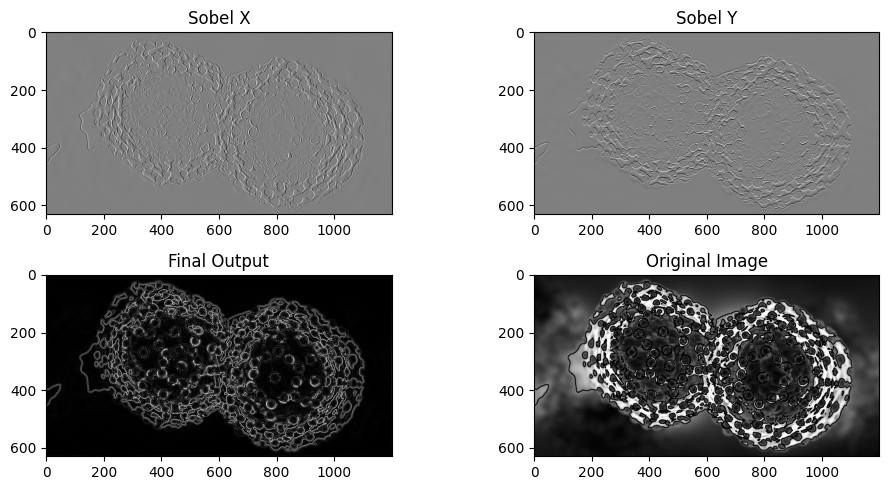

In [ ]:
# sobel operaror
sobel_x_kernel = np.array([
                   [-1, 0, 1],
                   [-2, 0, 2],
                   [-1, 0, 1]
                    ])
sobel_y_kernel = np.array([[-1, -2, -1],
                           [ 0,  0,  0],
                           [ 1,  2,  1]])
sobel_x_kernel=torch.tensor(sobel_x_kernel,dtype=torch.float32)
sobel_y_kernel=torch.tensor(sobel_y_kernel,dtype=torch.float32)
print('shape of sobel_x_kernel,sobel_y_kernel',sobel_x_kernel.shape,sobel_y_kernel.shape)

input_tensor=torch.tensor(img,dtype=torch.float32).unsqueeze(0).unsqueeze(0)
print('shape of input_tensor',input_tensor.shape)

filter_tensor_x=sobel_x_kernel.unsqueeze(0).unsqueeze(0)
filter_tensor_y=sobel_y_kernel.unsqueeze(0).unsqueeze(0)
print('shape of filter_tensor_x,filter_tensor_y',filter_tensor_x.shape,filter_tensor_y.shape)

import torch.nn.functional as F
con_sobel_x=F.conv2d(input_tensor,filter_tensor_x,padding=1)
conv_sobbel_y=F.conv2d(input_tensor,filter_tensor_y,padding=1)

print('shape of con_sobel_x,conv_sobbel_y',con_sobel_x.shape,conv_sobbel_y.shape)

final_output=torch.sqrt(con_sobel_x**2+conv_sobbel_y**2)

fig, axs = plt.subplots(2, 2, figsize=(10, 5))

# Plot the first image (con_sobel_x)
axs[0, 0].imshow(con_sobel_x.squeeze().numpy(), cmap='gray')
axs[0, 0].set_title('Sobel X')

# Plot the second image (conv_sobbel_y)
axs[0, 1].imshow(conv_sobbel_y.squeeze().numpy(), cmap='gray')
axs[0, 1].set_title('Sobel Y')

# Plot the final output (final_output)
axs[1, 0].imshow(final_output.squeeze().numpy(), cmap='gray')
axs[1, 0].set_title('Final Output')

# plot original image
axs[1, 1].imshow(img, cmap='gray')
axs[1, 1].set_title('Original Image')

# # Remove any empty subplots if needed
# axs[1, 1].axis('off')

# Leave the last subplot empty or you can add another image if needed
# axs[1, 1].axis('off')

# Display the plot
plt.tight_layout()
plt.show()

Shape of prewitt_x_kernel, prewitt_y_kernel: torch.Size([3, 3]) torch.Size([3, 3])
Shape of input_tensor: torch.Size([1, 1, 630, 1200])
Shape of filter_tensor_x, filter_tensor_y: torch.Size([1, 1, 3, 3]) torch.Size([1, 1, 3, 3])
Shape of conv_prewitt_x, conv_prewitt_y: torch.Size([1, 1, 630, 1200]) torch.Size([1, 1, 630, 1200])


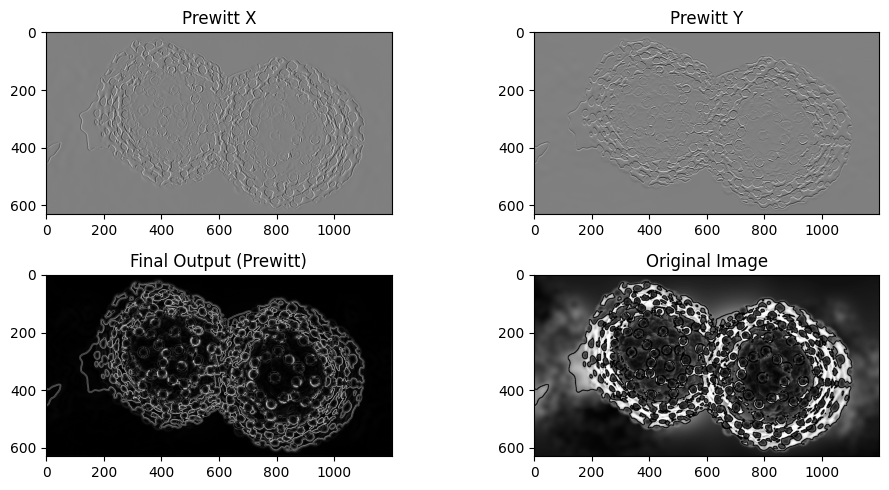

In [ ]:
# Prewitt kernels
prewitt_x_kernel = np.array([[-1, 0, 1],
                             [-1, 0, 1],
                             [-1, 0, 1]])

prewitt_y_kernel = np.array([[-1, -1, -1],
                             [ 0,  0,  0],
                             [ 1,  1,  1]])

# Convert kernels to PyTorch tensors
prewitt_x_kernel = torch.tensor(prewitt_x_kernel, dtype=torch.float32)
prewitt_y_kernel = torch.tensor(prewitt_y_kernel, dtype=torch.float32)
print('Shape of prewitt_x_kernel, prewitt_y_kernel:', prewitt_x_kernel.shape, prewitt_y_kernel.shape)

# Prepare the input tensor (same image as before)
input_tensor = torch.tensor(img, dtype=torch.float32).unsqueeze(0).unsqueeze(0)
print('Shape of input_tensor:', input_tensor.shape)

# Create filters by adding batch and channel dimensions
filter_tensor_x = prewitt_x_kernel.unsqueeze(0).unsqueeze(0)
filter_tensor_y = prewitt_y_kernel.unsqueeze(0).unsqueeze(0)
print('Shape of filter_tensor_x, filter_tensor_y:', filter_tensor_x.shape, filter_tensor_y.shape)

# Apply Prewitt operators using 2D convolution
conv_prewitt_x = F.conv2d(input_tensor, filter_tensor_x, padding=1)
conv_prewitt_y = F.conv2d(input_tensor, filter_tensor_y, padding=1)
print('Shape of conv_prewitt_x, conv_prewitt_y:', conv_prewitt_x.shape, conv_prewitt_y.shape)

# Compute final output by combining the gradients
final_output_prewitt = torch.sqrt(conv_prewitt_x**2 + conv_prewitt_y**2)

# Plotting the results
fig, axs = plt.subplots(2, 2, figsize=(10, 5))

# Plot the Prewitt X result
axs[0, 0].imshow(conv_prewitt_x.squeeze().numpy(), cmap='gray')
axs[0, 0].set_title('Prewitt X')

# Plot the Prewitt Y result
axs[0, 1].imshow(conv_prewitt_y.squeeze().numpy(), cmap='gray')
axs[0, 1].set_title('Prewitt Y')

# Plot the final output (Prewitt)
axs[1, 0].imshow(final_output_prewitt.squeeze().numpy(), cmap='gray')
axs[1, 0].set_title('Final Output (Prewitt)')

# Plot the original image
axs[1, 1].imshow(img, cmap='gray')
axs[1, 1].set_title('Original Image')

# Display the plot
plt.tight_layout()
plt.show()


Sobel X kernel shape: torch.Size([3, 3])
Sobel Y kernel shape: torch.Size([3, 3])
Input tensor shape: torch.Size([1, 1, 630, 1200])
Sobel X filter shape: torch.Size([1, 1, 3, 3])
Sobel Y filter shape: torch.Size([1, 1, 3, 3])


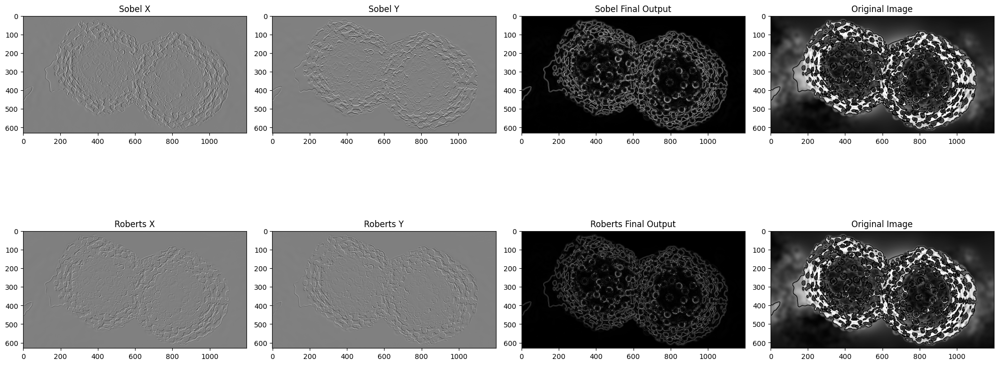

In [ ]:
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt

# Sobel Kernels
sobel_x_kernel = np.array([
                   [-1, 0, 1],
                   [-2, 0, 2],
                   [-1, 0, 1]
                    ])
sobel_y_kernel = np.array([
                   [-1, -2, -1],
                   [ 0,  0,  0],
                   [ 1,  2,  1]
                    ])

# Roberts Cross Kernels
roberts_x_kernel = np.array([[1, 0],
                             [0, -1]])

roberts_y_kernel = np.array([[0, 1],
                             [-1, 0]])

# Convert all kernels to tensors
sobel_x_kernel = torch.tensor(sobel_x_kernel, dtype=torch.float32)
sobel_y_kernel = torch.tensor(sobel_y_kernel, dtype=torch.float32)
roberts_x_kernel = torch.tensor(roberts_x_kernel, dtype=torch.float32)
roberts_y_kernel = torch.tensor(roberts_y_kernel, dtype=torch.float32)

print('Sobel X kernel shape:', sobel_x_kernel.shape)
print('Sobel Y kernel shape:', sobel_y_kernel.shape)

# Input image (assuming 'img' is already loaded and is grayscale)
input_tensor = torch.tensor(img, dtype=torch.float32).unsqueeze(0).unsqueeze(0)
print('Input tensor shape:', input_tensor.shape)

# Unsqueeze kernels for 4D input shape (required by conv2d)
sobel_filter_x = sobel_x_kernel.unsqueeze(0).unsqueeze(0)
sobel_filter_y = sobel_y_kernel.unsqueeze(0).unsqueeze(0)
roberts_filter_x = roberts_x_kernel.unsqueeze(0).unsqueeze(0)
roberts_filter_y = roberts_y_kernel.unsqueeze(0).unsqueeze(0)

print('Sobel X filter shape:', sobel_filter_x.shape)
print('Sobel Y filter shape:', sobel_filter_y.shape)

# Convolution with Sobel kernels
con_sobel_x = F.conv2d(input_tensor, sobel_filter_x, padding=1)
con_sobel_y = F.conv2d(input_tensor, sobel_filter_y, padding=1)
sobel_final_output = torch.sqrt(con_sobel_x**2 + con_sobel_y**2)

# Convolution with Roberts Cross kernels
con_roberts_x = F.conv2d(input_tensor, roberts_filter_x, padding=0)
con_roberts_y = F.conv2d(input_tensor, roberts_filter_y, padding=0)
roberts_final_output = torch.sqrt(con_roberts_x**2 + con_roberts_y**2)

# Plotting Sobel and Roberts results
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

# Sobel results
axs[0, 0].imshow(con_sobel_x.squeeze().numpy(), cmap='gray')
axs[0, 0].set_title('Sobel X')

axs[0, 1].imshow(con_sobel_y.squeeze().numpy(), cmap='gray')
axs[0, 1].set_title('Sobel Y')

axs[0, 2].imshow(sobel_final_output.squeeze().numpy(), cmap='gray')
axs[0, 2].set_title('Sobel Final Output')

axs[0, 3].imshow(img, cmap='gray')
axs[0, 3].set_title('Original Image')

# Roberts results
axs[1, 0].imshow(con_roberts_x.squeeze().numpy(), cmap='gray')
axs[1, 0].set_title('Roberts X')

axs[1, 1].imshow(con_roberts_y.squeeze().numpy(), cmap='gray')
axs[1, 1].set_title('Roberts Y')

axs[1, 2].imshow(roberts_final_output.squeeze().numpy(), cmap='gray')
axs[1, 2].set_title('Roberts Final Output')

axs[1, 3].imshow(img, cmap='gray')
axs[1, 3].set_title('Original Image')

plt.tight_layout()
plt.show()


# Syntax:

dst = cv2.filter2D(src, ddepth, kernel)


src: The source image (input image).


ddepth: Desired depth of the output image. Use -1 to have the same depth as the source image.


kernel: The kernel (filter) you want to apply to the image.

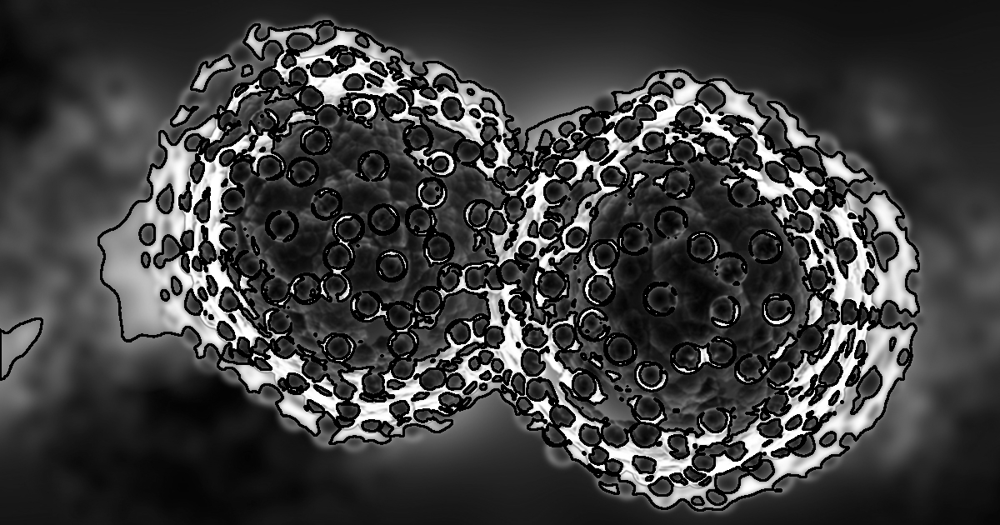

In [ ]:
kernel1=np.array(kernel)
edge_img=cv2.filter2D(src=img, ddepth=-1, kernel=kernel1)
cv2_imshow(img)



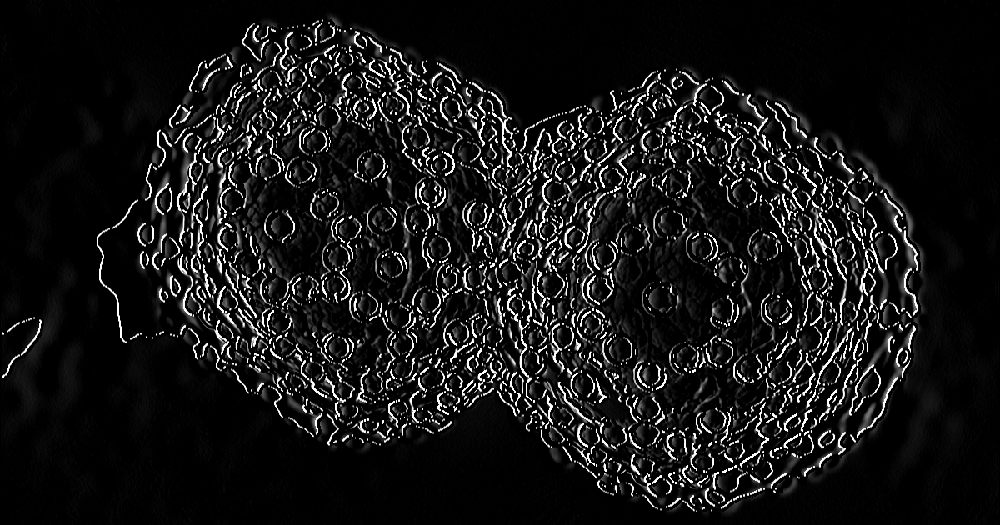

In [ ]:
# Define a sharpening kernel
kernel_sharpening = np.array([
                    [0, -1, 0],
                   [-1, 5,-1],
                   [0, -1, 0]])
sharp_img=cv2.filter2D(src=img, ddepth=cv2.CV_32F, kernel=kernel1)
cv2_imshow(sharp_img)

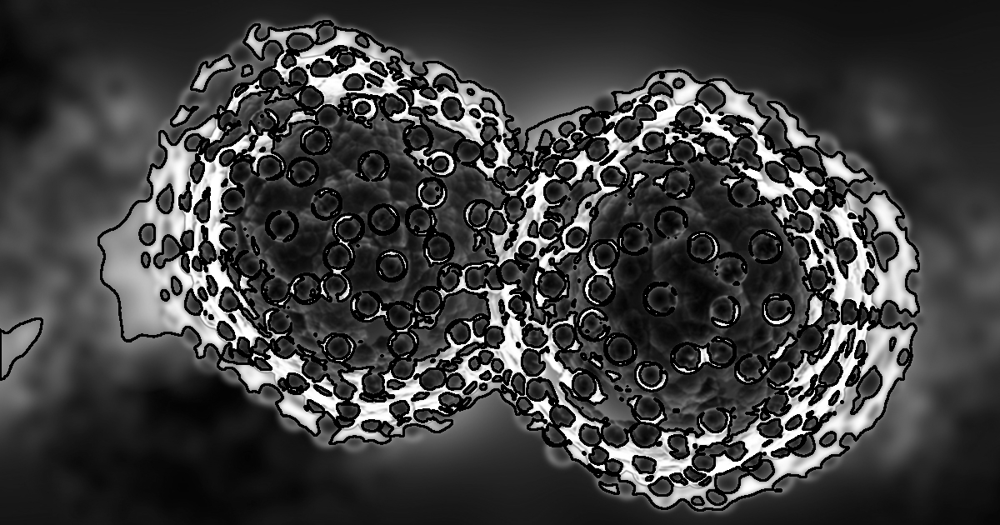

In [ ]:
#  Identity Kernel
kernel_identity = np.array([[0, 0, 0],
                   [0, 1, 0],
                   [0, 0, 0]])
identity_img=cv2.filter2D(src=img, ddepth=cv2.CV_32F, kernel=kernel_identity)
cv2_imshow(identity_img)


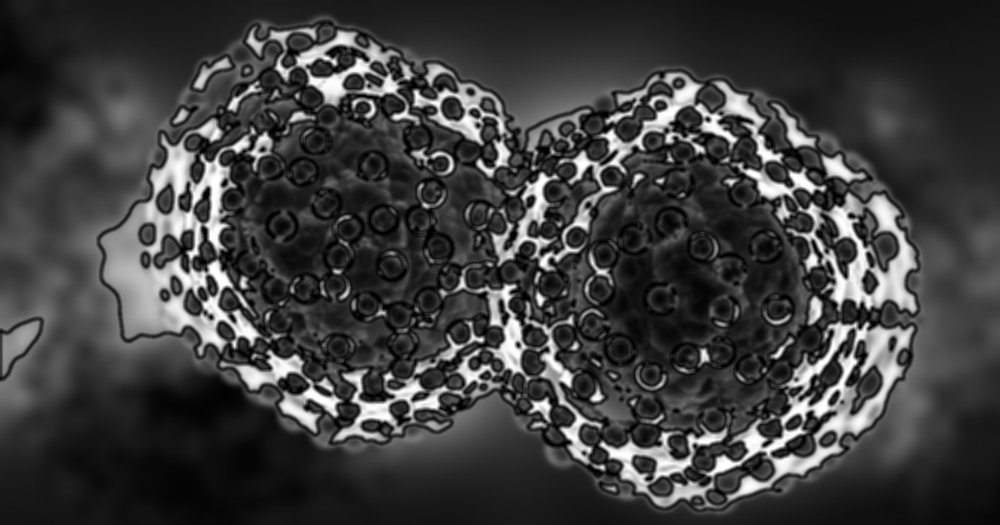

In [ ]:
# Box Blur (Averaging Filter)
kernel_box = np.ones((5,5),np.float32)/25
box_img=cv2.filter2D(src=img, ddepth=cv2.CV_32F, kernel=kernel_box)
cv2_imshow(box_img)

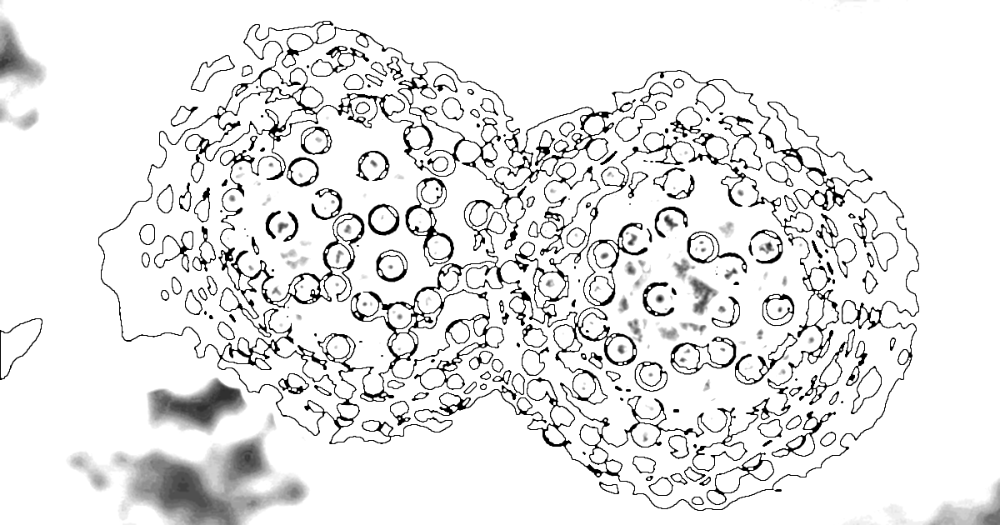

In [ ]:
# Gaussian Blur
kernel_gaussian = np.array([[1, 2, 1],
                   [2, 4, 2],
                   [1, 2, 1]])
gaussian_img=cv2.filter2D(src=img, ddepth=cv2.CV_32F, kernel=kernel_gaussian)
cv2_imshow(gaussian_img)

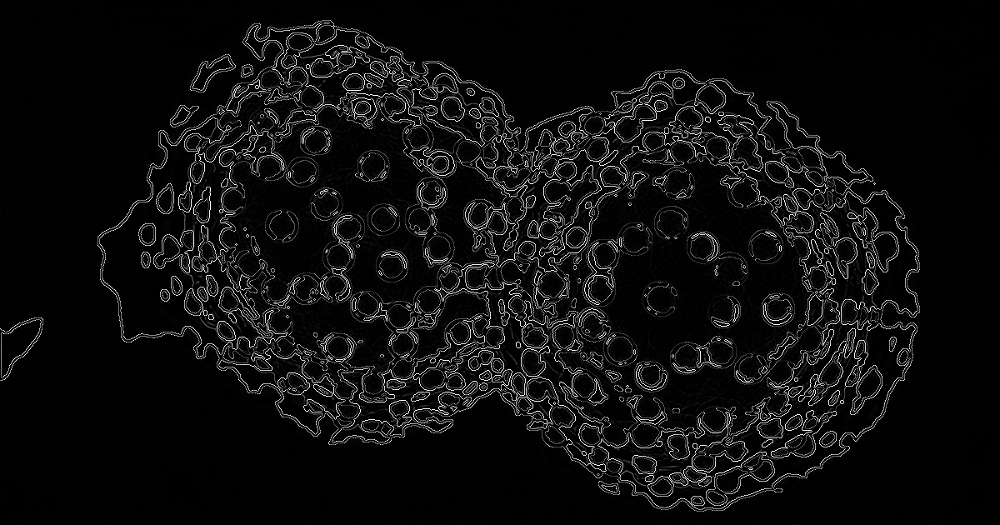

In [ ]:
#  Laplacian Kernel
laplacian_kernel = np.array([[ 0,  1,  0],
                             [ 1, -4,  1],
                             [ 0,  1,  0]])
laplacian_img=cv2.filter2D(src=img, ddepth=cv2.CV_32F, kernel=laplacian_kernel)
cv2_imshow(laplacian_img)


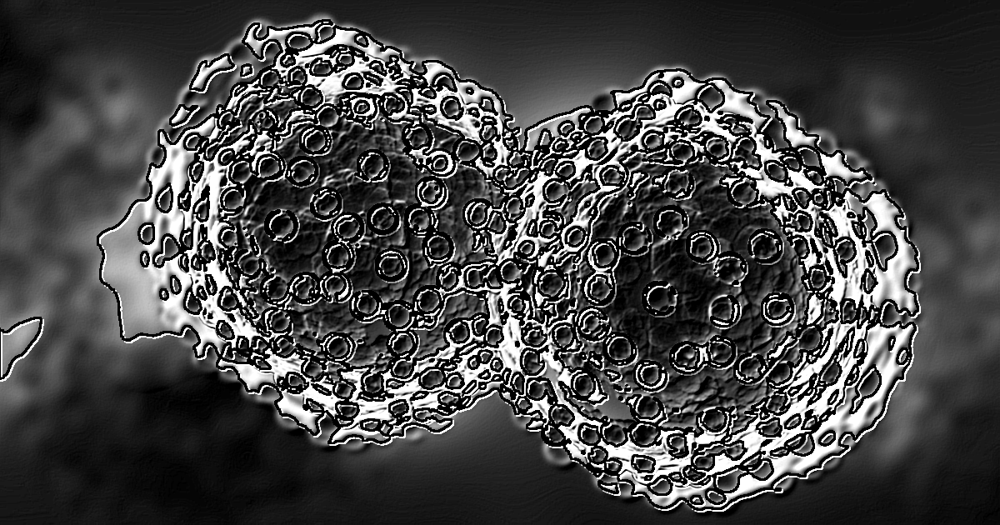

In [ ]:
#  Emboss Kernel
emboss_kernel = np.array([[-2, -1,  0],
                          [-1,  1,  1],
                          [ 0,  1,  2]])
Emboss_img=cv2.filter2D(src=img, ddepth=cv2.CV_32F, kernel=emboss_kernel)
cv2_imshow(Emboss_img)

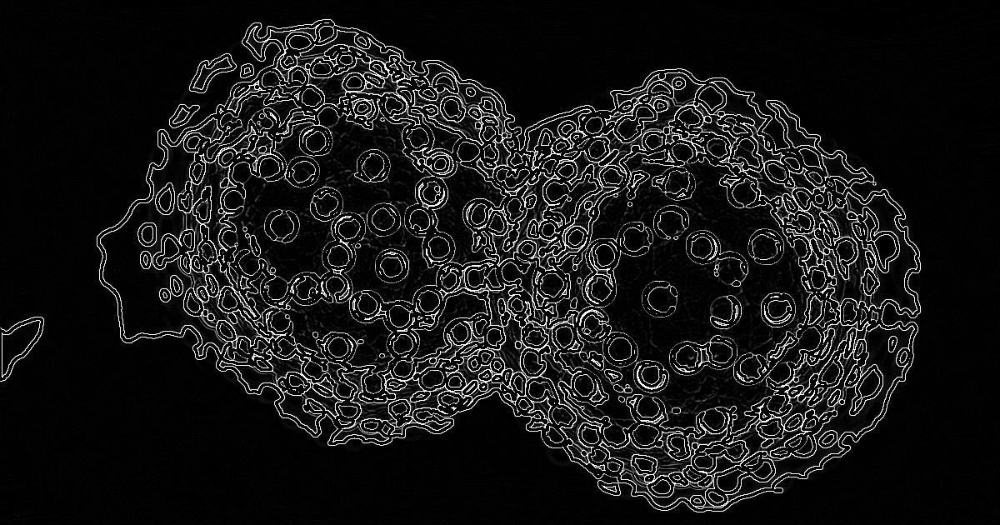

In [ ]:
# Outline Kernel
outline_kernel = np.array([[-1, -1, -1],
                           [-1,  8, -1],
                           [-1, -1, -1]])
outline_img=cv2.filter2D(src=img, ddepth=cv2.CV_32F, kernel=outline_kernel)
cv2_imshow(outline_img)
#

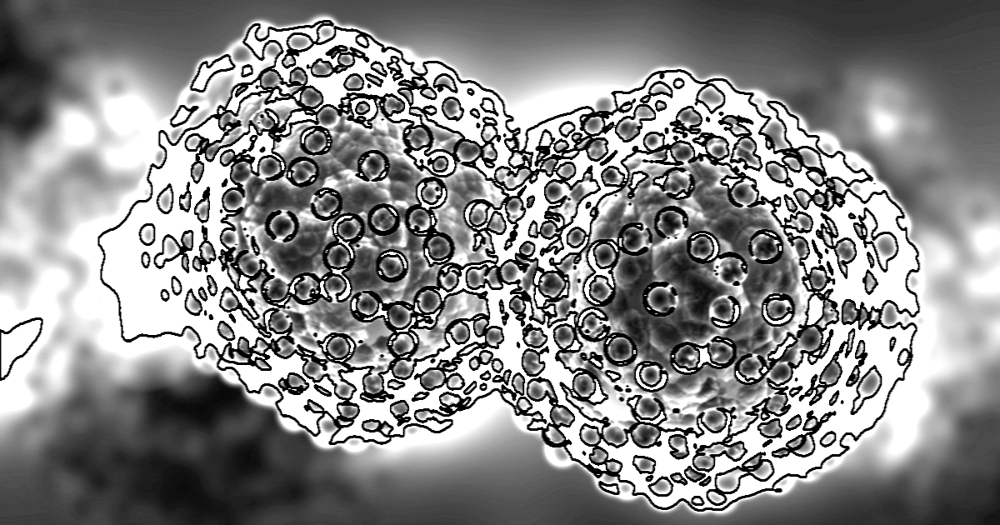

In [ ]:
# Motion Blur Kernel
motion_blur_kernel = np.array([[0, 0, 0],
                               [1, 1, 1],
                               [0, 0, 0]])
motion_blur_img=cv2.filter2D(src=img, ddepth=cv2.CV_32F, kernel=motion_blur_kernel)
cv2_imshow(motion_blur_img)


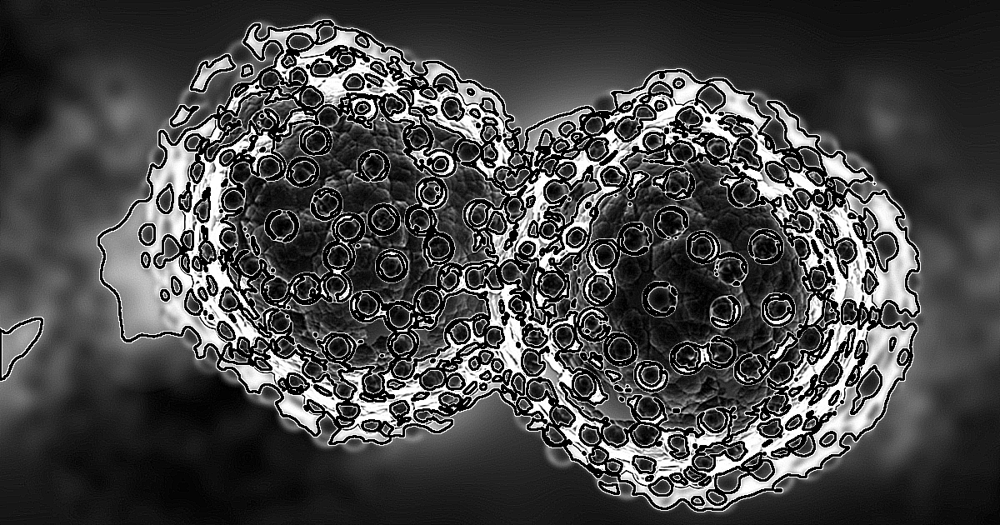

In [ ]:
# Edge Enhancement
edge_enhancement_kernel = np.array([[-1, -1, -1],
                                    [-1,  9, -1],
                                    [-1, -1, -1]])
edge_enhance_img=cv2.filter2D(src=img, ddepth=cv2.CV_32F, kernel=edge_enhancement_kernel)
cv2_imshow(edge_enhance_img)

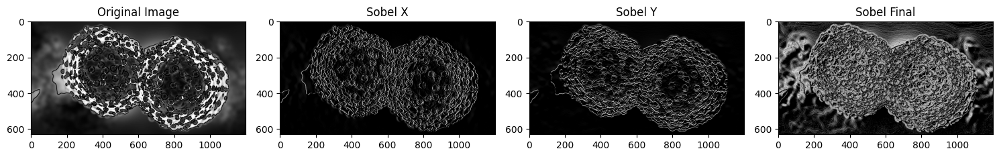

In [ ]:
# Sobel kernels
sobel_x_kernel = np.array([
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1]
])

sobel_y_kernel = np.array([
    [-1, -2, -1],
    [ 0,  0,  0],
    [ 1,  2,  1]
])

# Apply the Sobel filters
sobel_x = cv2.filter2D(img, -1, sobel_x_kernel)
sobel_y = cv2.filter2D(img, -1, sobel_y_kernel)

# Compute the final Sobel output
sobel_final = np.sqrt(sobel_x**2 + sobel_y**2)

# Plotting the results
fig, axs = plt.subplots(1, 4, figsize=(15, 5))

axs[0].imshow(img, cmap='gray')
axs[0].set_title('Original Image')

axs[1].imshow(sobel_x, cmap='gray')
axs[1].set_title('Sobel X')

axs[2].imshow(sobel_y, cmap='gray')
axs[2].set_title('Sobel Y')

axs[3].imshow(sobel_final, cmap='gray')
axs[3].set_title('Sobel Final')

plt.tight_layout()
plt.show()

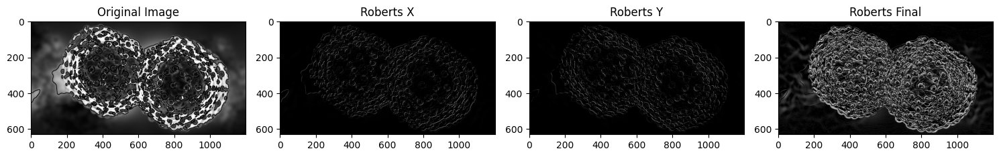

In [ ]:
# Roberts Cross kernels
roberts_x_kernel = np.array([[1, 0],
                             [0, -1]])

roberts_y_kernel = np.array([[0, 1],
                             [-1, 0]])

# Apply the Roberts filters
roberts_x = cv2.filter2D(img, -1, roberts_x_kernel)
roberts_y = cv2.filter2D(img, -1, roberts_y_kernel)

# Compute the final Roberts output
roberts_final = np.sqrt(roberts_x**2 + roberts_y**2)

# Plotting the results
fig, axs = plt.subplots(1, 4, figsize=(15, 5))

axs[0].imshow(img, cmap='gray')
axs[0].set_title('Original Image')

axs[1].imshow(roberts_x, cmap='gray')
axs[1].set_title('Roberts X')

axs[2].imshow(roberts_y, cmap='gray')
axs[2].set_title('Roberts Y')

axs[3].imshow(roberts_final, cmap='gray')
axs[3].set_title('Roberts Final')

plt.tight_layout()
plt.show()
